In [2]:
import cv2
import numpy             as np
import pandas            as pd
import seaborn           as sns
import matplotlib.cm     as cm
import matplotlib.pyplot as plt

from PIL  import Image
from glob import glob

In [2]:
file_list = glob('MLP-Project/results/baseline_2/*csv')
labels    = ['baseline-pretrained', 'input-pretrained', 'baseline-scratch', 'input-scratch']
res_dict  = dict()

for idx, file_name in enumerate(file_list):
    df = pd.read_csv(file_name, delimiter=' ', header=1)
    res_dict[labels[idx]] = df
    
file_list  = glob('MLP-Project/results/esanet_2/*csv')
labels     = ['esanet_early-pretrained', 'esanet_all-pretrained', 'esanet_late-pretrained', 'esanet_aspp-pretrained'] 
labels    += ['esanet_early-scratch',    'esanet_all-scratch',    'esanet_late-scratch',    'esanet_aspp-scratch']

for idx, file_name in enumerate(file_list):
    df = pd.read_csv(file_name, delimiter=' ', header=1)
    res_dict[labels[idx]] = df
    
file_list  = glob('MLP-Project/results/dconv/*csv')
labels     = ['dconv_first_all-pretrained', 'dconv_first-pretrained', 'dconv_all-pretrained', 'dconv-pretrained'] 
labels    += ['dconv_first_all-scratch',    'dconv_first-scratch',    'dconv_all-scratch',    'dconv-scratch']

for idx, file_name in enumerate(file_list):
    df = pd.read_csv(file_name, delimiter=' ', header=1)
    res_dict[labels[idx]] = df

file_list = glob('MLP-Project/results/baseline_decay/*csv')
labels    = ['baseline_2e3-pretrained', 'baseline_5e3-pretrained', 'baseline_1e3-pretrained']

for idx, file_name in enumerate(file_list):
    df = pd.read_csv(file_name, delimiter=' ', header=1)
    res_dict[labels[idx]] = df
    
file_list = glob('MLP-Project/results/decay_1_small/*csv')
labels    = ['esanet_1e2-pretrained', 'esanet_1e3-pretrained']

for idx, file_name in enumerate(file_list):
    df = pd.read_csv(file_name, delimiter=' ', header=1)
    res_dict[labels[idx]] = df
    
file_list = glob('MLP-Project/results/finer_decay_esa/*csv')
labels    = ['esanet_2e3-pretrained', 'esanet_5e3-pretrained']

for idx, file_name in enumerate(file_list):
    df = pd.read_csv(file_name, delimiter=' ', header=1)
    res_dict[labels[idx]] = df
    
file_list = glob('MLP-Project/results/decay2/*csv')
labels    = ['dconv_1e2-pretrained', 'dconv_1e3-pretrained', 'dconv_first_1e2-pretrained', 'dconv_first_1e3-pretrained']

for idx, file_name in enumerate(file_list):
    df = pd.read_csv(file_name, delimiter=' ', header=1)
    res_dict[labels[idx]] = df

file_list = glob('MLP-Project/results/dconv_fine_decay/*csv')
labels    = ['dconv_5e3-pretrained']

for idx, file_name in enumerate(file_list):
    df = pd.read_csv(file_name, delimiter=' ', header=1)
    res_dict[labels[idx]] = df
    
results = [(key, df.max()['Mean_IoU']) for key, df in res_dict.items()]
results = pd.DataFrame([x[1] for x in results], index=[x[0] for x in results], columns=['Mean_IoU'])
results = results.sort_values(by='Mean_IoU').round(3)

scratch = results.iloc[:10]
scratch = scratch.iloc[[0,1,2,3,4,6,8,9]]
scratch = scratch.rename(index={'esanet_all-scratch':      'ESANet',
                                'esanet_late-scratch':     'Late Fusion', 
                                'input-scratch':           'RGB-D', 
                                'esanet_early-scratch':    'Early Fusion', 
                                'baseline-scratch':        'Baseline', 
                                'esanet_aspp-scratch':     'ASPP Fusion', 
                                'dconv_first_all-scratch': 'Depth-aware $CNN^1$', 
                                'dconv-scratch':           'Depth-aware $CNN^2$'},
                        columns={'Mean_IoU': 'Trained from scratch'})

pre = results.iloc[10:]
pre = pre.iloc[[0,1,3,10,13,15,20,21]]
pre = pre.rename(index={'esanet_all-pretrained':      'ESANet',
                        'esanet_late-pretrained':     'Late Fusion', 
                        'input-pretrained':           'RGB-D', 
                        'esanet_early-pretrained':    'Early Fusion', 
                        'baseline_1e3-pretrained':    'Baseline', 
                        'esanet_5e3-pretrained':      'ASPP Fusion', 
                        'dconv_all-pretrained':       'Depth-aware $CNN^1$', 
                        'dconv_5e3-pretrained':       'Depth-aware $CNN^2$'},
                columns={'Mean_IoU': 'Pre-trained'})

results['Model'] = results.index

dconv = results.iloc[[i for i, x in enumerate(results['Model']) if 'dconv' in x]][-4:]
dconv = dconv[['Mean_IoU']]
dconv = dconv.rename(index={'dconv_first_1e3-pretrained': '1e-3',
                        'dconv-pretrained':               '1e-4', 
                        'dconv_first_1e2-pretrained':     '1e-2', 
                        'dconv_5e3-pretrained':           '5e-3'},
                columns={'Mean_IoU': 'Depth-aware CNN'})

esa = results.iloc[[i for i, x in enumerate(results['Model']) if 'esanet' in x]].iloc[[5,6,9,10,11]]
esa = esa[['Mean_IoU']]
esa = esa.rename(index={'esanet_1e2-pretrained':   '1e-2',
                        'esanet_1e3-pretrained':   '1e-3', 
                        'esanet_early-pretrained': '1e-4', 
                        'esanet_2e3-pretrained':   '2e-3',
                        'esanet_5e3-pretrained':   '5e-3'},
                columns={'Mean_IoU': 'ESANet'})

base = results.iloc[[i for i, x in enumerate(results['Model']) if 'baseline' in x]].iloc[1:]
base = base[['Mean_IoU']]
base = base.rename(index={'baseline-pretrained':   '1e-4',
                        'baseline_5e3-pretrained': '5e-3', 
                        'baseline_2e3-pretrained': '2e-3', 
                        'baseline_1e3-pretrained': '1e-3'},
                columns={'Mean_IoU': 'Baseline'})

print(pd.concat([base, esa, dconv], axis=1).to_latex())

\begin{tabular}{lrrr}
\toprule
{} &  Baseline &  ESANet &  Depth-aware CNN \\
\midrule
1e-4 &     0.586 &   0.576 &            0.570 \\
5e-3 &     0.590 &   0.582 &            0.591 \\
2e-3 &     0.590 &   0.576 &              NaN \\
1e-3 &     0.598 &   0.557 &            0.562 \\
1e-2 &       NaN &   0.556 &            0.586 \\
\bottomrule
\end{tabular}



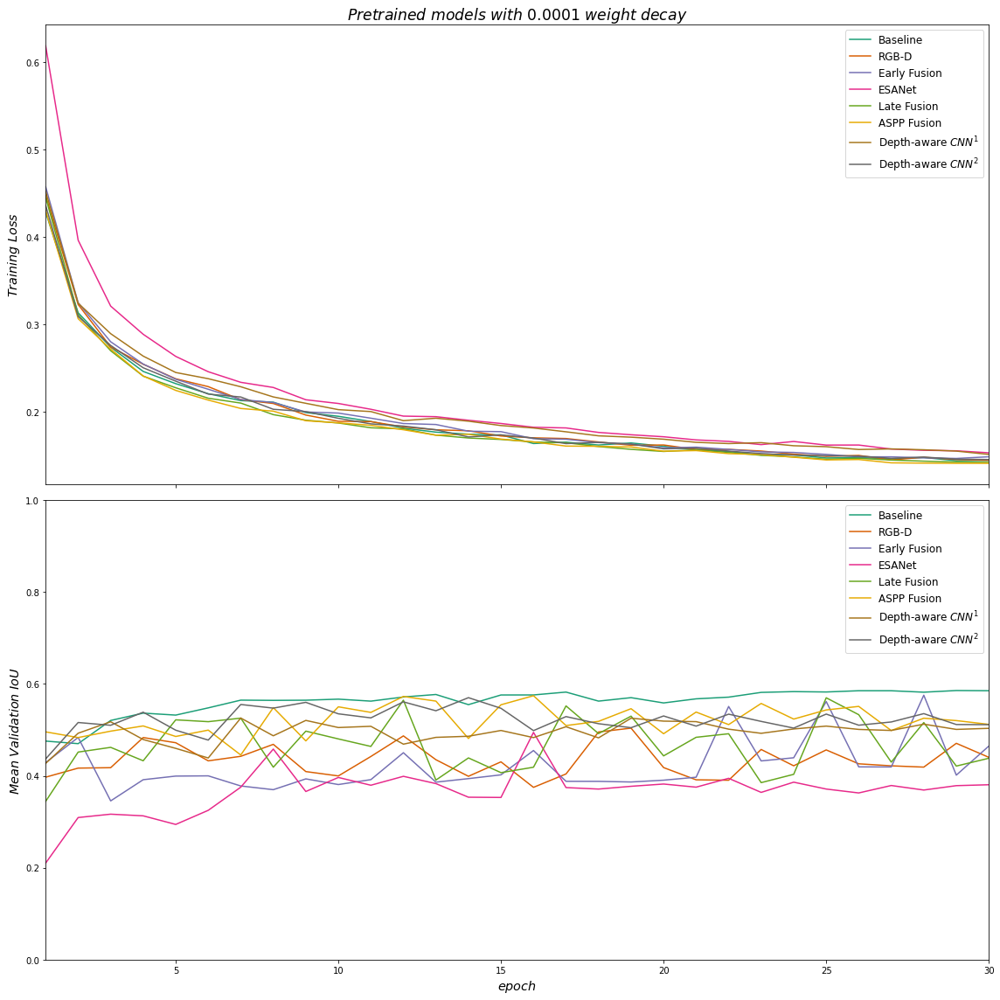

In [3]:
mode      = 'pretrained'
value     = 'Mean_IoU'
legend    = []
fig, axes = plt.subplots(2, 1, figsize=(16,16), sharex=True)
cmap      = plt.get_cmap('Dark2');
cnt       = 0

ax = axes[1]

for key, df in res_dict.items():
    if mode in key and 'e2' not in key and not 'e3' in key and 'dconv_first' not in key:
        sns.lineplot(x=np.arange(1,len(df[value]) + 1), y=df[value], ax=ax, color=cmap(1/16 + cnt/8))
        
        cnt += 1

legend = ['Baseline', 'RGB-D', 'Early Fusion', 'ESANet', 'Late Fusion', 'ASPP Fusion', 'Depth-aware $CNN^1$', 
          'Depth-aware $CNN^2$']
        
ax.set_xlim([1,30]);
ax.legend(legend, fontsize='large');
ax.set_ylabel('$Mean$ $Validation$ $IoU$', fontsize='x-large')
ax.set_xlabel('$epoch$', fontsize='x-large');
ax.set_ylim([0, 1])

mode  = 'pretrained'
value = 'Train_loss'
cnt   = 0
ax    = axes[0]

for key, df in res_dict.items():
    if mode in key and 'e2' not in key and not 'e3' in key and 'dconv_first' not in key:
        sns.lineplot(x=np.arange(1,len(df[value]) + 1), y=df[value], ax=ax, color=cmap(1/16 + cnt/8))
        
        cnt += 1
        
ax.legend(legend, fontsize='large');
ax.set_ylabel('$Training$ $Loss$', fontsize='x-large')
ax.set_xlabel('$epoch$', fontsize='x-large');
ax.set_title('$Pretrained$ $models$ $with$ $0.0001$ $weight$ $decay$', fontsize='xx-large');

fig.tight_layout()
plt.savefig('unregularized.pdf')

In [4]:
train = {'BUILDING': 3.842574590678305, 'CLUTTER': 2.3139125639416585, 'VEGETATION': 26.26976971494856, 
         'WATER':    2.954526974347272, 'GROUND':  64.29186757183334,  'CAR':        0.32734858425086044}

valid = {'BUILDING': 6.852593301435407, 'CLUTTER': 3.7351238702817655, 'VEGETATION': 16.659332270069115,
         'WATER':    2.313207868155237, 'GROUND':  70.07914832535886,  'CAR':        0.36059436469962786}

arr      = np.zeros((2, 6))
t        = np.array(list(train.values()))
v        = np.array(list(valid.values()))
arr[0,:] = t
arr[1,:] = v

print(pd.DataFrame(arr, columns=train.keys(), index=['training', 'validation']).round(2).transpose().to_latex())

\begin{tabular}{lrr}
\toprule
{} &  training &  validation \\
\midrule
BUILDING   &      3.84 &        6.85 \\
CLUTTER    &      2.31 &        3.74 \\
VEGETATION &     26.27 &       16.66 \\
WATER      &      2.95 &        2.31 \\
GROUND     &     64.29 &       70.08 \\
CAR        &      0.33 &        0.36 \\
\bottomrule
\end{tabular}



In [24]:
images   = sorted(glob('report/examplePASCAL/*image.png'))
print(images)
im_tiles = []

for image in images:
    im_tiles += [Image.open(image)]
    
# unweighted = glob('report/unweighted/*overlay.png')
# un_tiles   = []

# for image in unweighted:
#     un_tiles += [Image.open(image)]
    
# weighted = glob('report/weighted/*overlay.png')
# w_tiles  = []

# for image in weighted:
#     w_tiles += [Image.open(image)]
    
target  = sorted(glob('report/examplePASCAL/*target.png'))
print(target)
t_tiles = []

for image in target:
    t_tiles += [Image.open(image)]
    
tiles = [im_tiles, t_tiles]

['report/examplePASCAL/1_image.png', 'report/examplePASCAL/4_image.png', 'report/examplePASCAL/5_image.png', 'report/examplePASCAL/6_image.png', 'report/examplePASCAL/7_image.png']
['report/examplePASCAL/1_target.png', 'report/examplePASCAL/4_target.png', 'report/examplePASCAL/5_target.png', 'report/examplePASCAL/6_target.png', 'report/examplePASCAL/7_target.png']


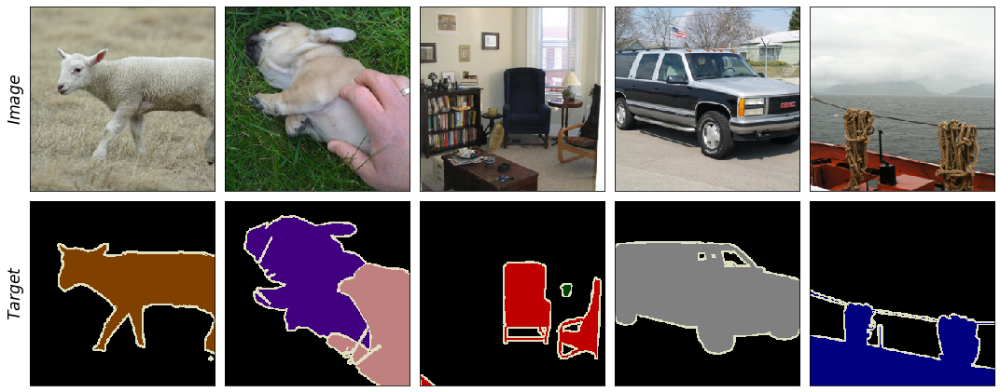

In [25]:
fig, ax = plt.subplots(2,5, figsize=(15,6))

for i in range(5):
    for j in range(2):
        ax[j,i].imshow(tiles[j][i])
        ax[j,i].tick_params(bottom=False,           top=False,      right=False,      left=False,
                            labelbottom=False, labeltop=False, labelright=False, labelleft=False)

ax[0,0].set_ylabel('$Image$',      fontsize='xx-large');
ax[1,0].set_ylabel('$Target$',     fontsize='xx-large');

fig.tight_layout()
plt.savefig('predictions.pdf')

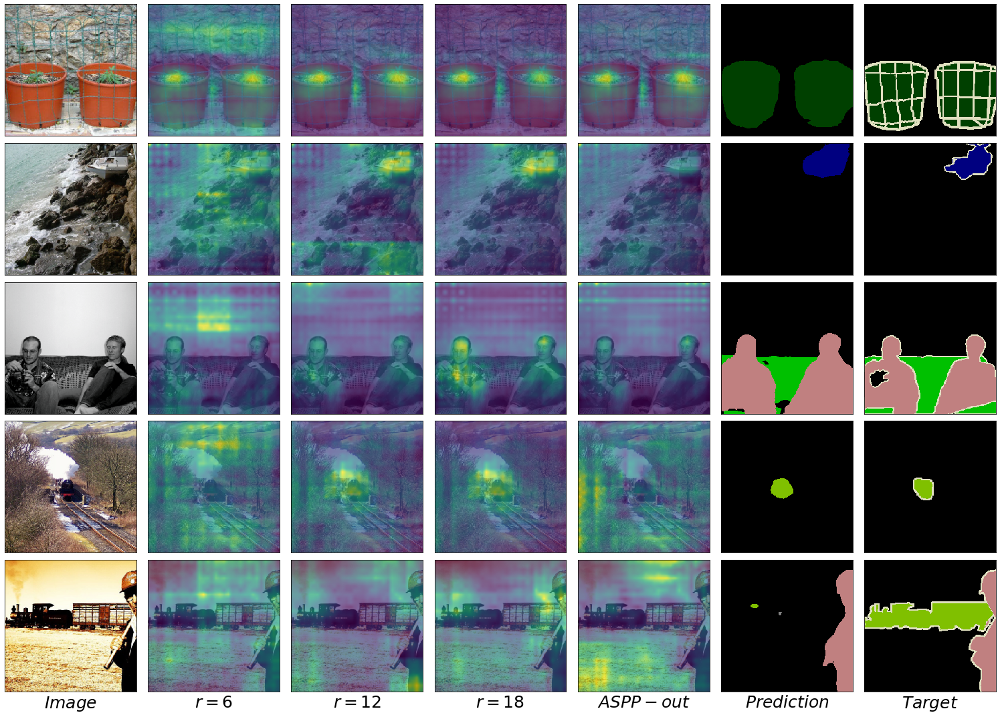

In [18]:
images   = sorted(glob('report/exampleAT/2*.png'))
im_tiles = []
for image in images:
    im_tiles += [Image.open(image)]
    
images   = sorted(glob('report/exampleAT/4*.png'))
im_tiles2 = []
for image in images:
    im_tiles2 += [Image.open(image)]
    
images   = sorted(glob('report/exampleAT/12*.png'))
im_tiles3 = []
for image in images:
    im_tiles3 += [Image.open(image)]
    
images   = sorted(glob('report/exampleAT/1_*.png'))
im_tiles4 = []
for image in images:
    im_tiles4 += [Image.open(image)]
    
images   = sorted(glob('report/exampleAT/6*.png'))
im_tiles5 = []
for image in images:
    im_tiles5 += [Image.open(image)]
    
tiles = [im_tiles, im_tiles2, im_tiles3, im_tiles4, im_tiles5]

fig, ax = plt.subplots(5,7, figsize=(21,15))

for i in range(7):
    for j in range(5):
        ax[j,i].imshow(tiles[j][i])
        ax[j,i].tick_params(bottom=False,           top=False,      right=False,      left=False,
                            labelbottom=False, labeltop=False, labelright=False, labelleft=False)

ax[4,0].set_xlabel('$Image$',      fontsize='25');
ax[4,1].set_xlabel('$r=6$',     fontsize='25');
ax[4,2].set_xlabel('$r=12$',     fontsize='25');
ax[4,3].set_xlabel('$r=18$',     fontsize='25');
ax[4,4].set_xlabel('$ASPP-out$',     fontsize='25');
ax[4,5].set_xlabel('$Prediction$',      fontsize='25');
ax[4,6].set_xlabel('$Target$',      fontsize='25');

fig.tight_layout()
plt.savefig('exampleATPred.pdf')

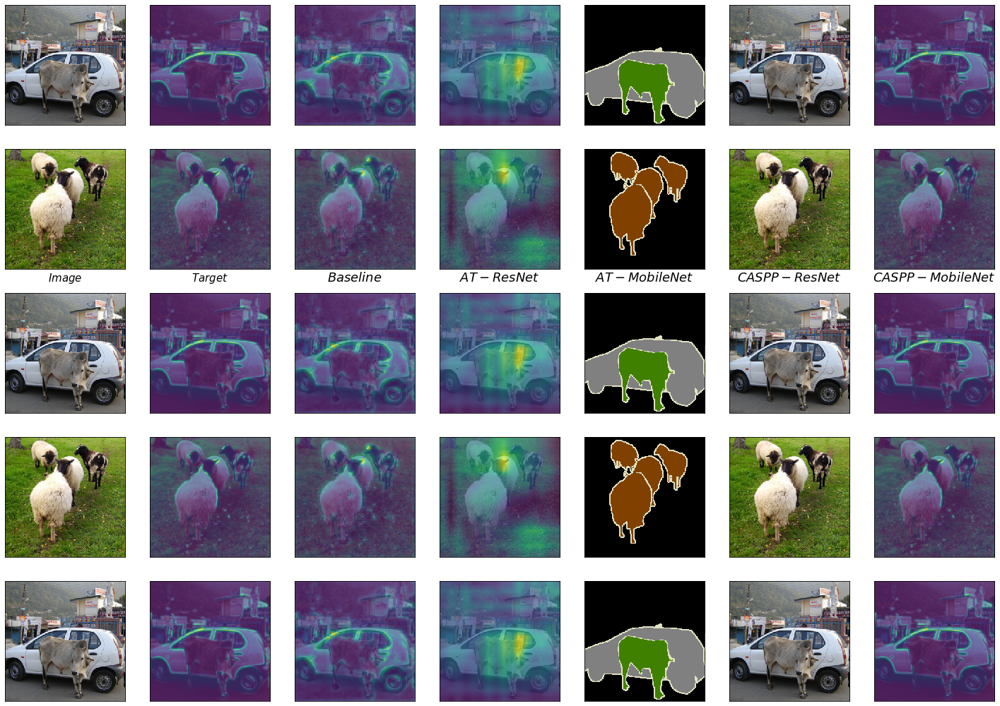

In [29]:
images   = sorted(glob('report/examplePred/0*.png'))
im_tiles = []

for image in images:
    im_tiles += [Image.open(image)]
    
images2   = sorted(glob('report/examplePred/2*.png'))
im_tiles2 = []

for image in images2:
    im_tiles2 += [Image.open(image)]
    
tiles = [im_tiles, im_tiles2]

fig, ax = plt.subplots(5,7, figsize=(20,14))

for i in range(7):
    for j in range(5):
        ax[j,i].imshow(tiles[j%2][i%5])
        ax[j,i].tick_params(bottom=False,           top=False,      right=False,      left=False,
                            labelbottom=False, labeltop=False, labelright=False, labelleft=False)

ax[1,0].set_xlabel('$Image$',      fontsize='15');
ax[1,1].set_xlabel('$Target$',     fontsize='15');
ax[1,2].set_xlabel('$Baseline$',     fontsize='18');
ax[1,3].set_xlabel('$AT-ResNet$',     fontsize='18');
ax[1,4].set_xlabel('$AT-MobileNet$',     fontsize='18');
ax[1,5].set_xlabel('$CASPP-ResNet$',     fontsize='18');
ax[1,6].set_xlabel('$CASPP-MobileNet$',     fontsize='18');

fig.tight_layout()
plt.savefig('examplePred.pdf')

In [7]:
# cmap_name is a String name of color map from https://matplotlib.org/stable/tutorials/colors/colormaps.html
# Converts raw elevation encoding into pretty color map. Saves it in out_file.
def elevation_to_cmap(in_file, out_file, cmap_name='magma'):
    color_map = cm.get_cmap(cmap_name)
    image     = cv2.imdecode(np.fromfile(in_file, dtype=np.uint8), cv2.IMREAD_UNCHANGED)
    real_min  = np.min(image[image != ELEVATION_IGNORE])
    real_max  = np.max(image)
    
    # Encodes the IGNORE class with same elevation as minium non-IGNORE pixel.
    image[image == ELEVATION_IGNORE] = real_min
    
    # Normalize and convert to color map.
    image = (image - real_min) / (real_max - real_min)
    image = color_map(image)[:,:,:3]
    image = image * 255
    image = np.uint8(image)
    image = Image.fromarray(image)
    
    image.save(out_file)

In [8]:
file_list        = glob('report/appendix/eleva_name/*.png')
file_list        = [x[len('report/appendix/eleva_name\\'):-3] for x in file_list]
ELEVATION_IGNORE = -32767.0

for i, file_name in enumerate(file_list):
    path = './MLP-project/datasets/dataset-medium/elevation-chips/' + file_name + 'tif'
    
    elevation_to_cmap(path, 'eleva_' + str(i) + '.png')

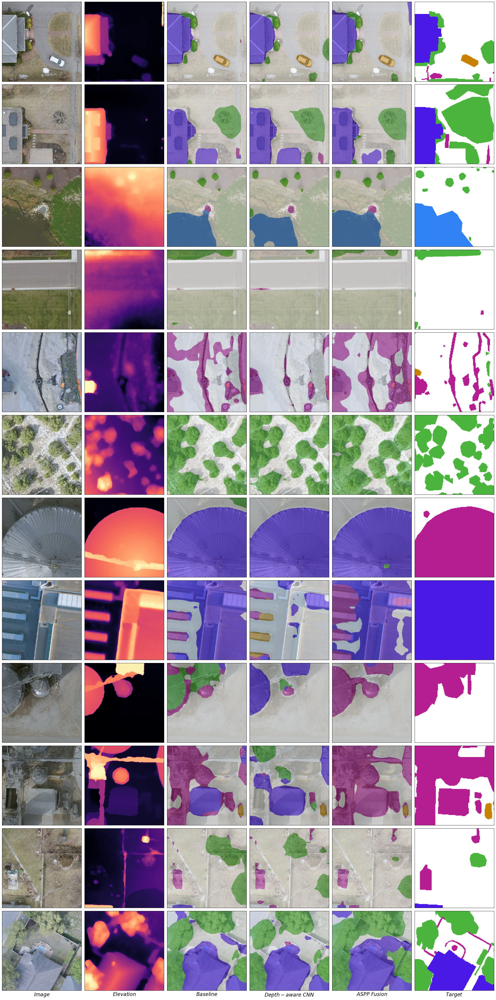

In [9]:
images   = glob('report/appendix/baseline/*image.png')
im_tiles = []

for image in images:
    im_tiles += [Image.open(image)]
    
eleva    = glob('report/appendix/baseline/*eleva.png')
el_tiles = []

for image in eleva:
    el_tiles += [Image.open(image)]
    
base     = glob('report/appendix/baseline/*overlay.png')
ba_tiles = []

for image in base:
    ba_tiles += [Image.open(image)]
    
dconv    = glob('report/appendix/dconv/*overlay.png')
dc_tiles = []

for image in dconv:
    dc_tiles += [Image.open(image)]
    
esanet    = glob('report/appendix/esanet/*overlay.png')
esa_tiles = []

for image in esanet:
    esa_tiles += [Image.open(image)]
    
target  = glob('report/appendix/esanet/*target.png')
t_tiles = []

for image in target:
    t_tiles += [Image.open(image)]
    
tiles   = [im_tiles, el_tiles, ba_tiles, dc_tiles, esa_tiles, t_tiles]
fig, ax = plt.subplots(12,6, figsize=(24,48))

for i in range(12):
    for j in range(6):
        ax[i,j].imshow(tiles[j][i])
        ax[i,j].tick_params(     bottom=False,      top=False,      right=False,      left=False,
                            labelbottom=False, labeltop=False, labelright=False, labelleft=False)

ax[11,0].set_xlabel('$Image$',             fontsize='xx-large');
ax[11,1].set_xlabel('$Elevation$',         fontsize='xx-large');
ax[11,2].set_xlabel('$Baseline$',          fontsize='xx-large');
ax[11,3].set_xlabel('$Depth-aware$ $CNN$', fontsize='xx-large');
ax[11,4].set_xlabel('$ASPP$ $Fusion$',     fontsize='xx-large');
ax[11,5].set_xlabel('$Target$',            fontsize='xx-large');

fig.tight_layout()
plt.savefig('appendix1.png')